## Experiment: Feature Detection and Description using SIFT, ORB, and SURF

### AIM
To implement and analyze feature detection and description techniques using SIFT (Scale Invariant Feature Transform), ORB (Oriented FAST and Rotated BRIEF), and SURF (Speeded-Up Robust Features) algorithms in OpenCV, and to evaluate their performance based on keypoint detection capability, computational efficiency, and robustness to scale and rotation variations.

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# ------------------------------------------------------------
# IMAGE LOADING
# ------------------------------------------------------------
def load_and_prepare_image(image_path):
    """
    Load color image and convert to grayscale.
    """
    img_color = cv2.imread(image_path)
    if img_color is None:
        raise FileNotFoundError(f"Cannot load image: {image_path}")

    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    return img_color, img_gray




In [3]:
# ------------------------------------------------------------
# FEATURE DETECTORS
# ------------------------------------------------------------
def detect_and_compute_sift(gray_img):
    """
    Detect keypoints and compute SIFT descriptors.
    Descriptor type: float (128-D)
    """
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_img, None)
    return keypoints, descriptors


def detect_and_compute_orb(gray_img, nfeatures=1500):
    """
    Detect keypoints and compute ORB descriptors.
    Descriptor type: binary
    """
    orb = cv2.ORB_create(nfeatures=nfeatures)
    keypoints, descriptors = orb.detectAndCompute(gray_img, None)
    return keypoints, descriptors


def detect_and_compute_surf(gray_img):
    """
    SURF detector (may not be available in pip OpenCV).
    """
    try:
        surf = cv2.xfeatures2d.SURF_create()
        keypoints, descriptors = surf.detectAndCompute(gray_img, None)
        return keypoints, descriptors
    except:
        print("SURF not available in this OpenCV build.")
        return [], None




In [4]:
# ------------------------------------------------------------
# KEYPOINT VISUALIZATION
# ------------------------------------------------------------
def draw_keypoints(img_color, keypoints, title):
    img_kp = cv2.drawKeypoints(
        img_color,
        keypoints,
        None,
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

    plt.figure(figsize=(10, 7))
    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()




In [5]:
# ------------------------------------------------------------
# FEATURE MATCHING (BF + RATIO TEST)
# ------------------------------------------------------------
def match_features(des1, des2, method="SIFT", ratio_thresh=0.75):
    """
    Match descriptors using BFMatcher + Lowe's ratio test.
    """
    if method == "SIFT":
        bf = cv2.BFMatcher(cv2.NORM_L2)
    else:  # ORB
        bf = cv2.BFMatcher(cv2.NORM_HAMMING)

    matches = bf.knnMatch(des1, des2, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)

    return good_matches


def draw_matches(img1, kp1, img2, kp2, matches, title):
    """
    Draw feature matches between two images.
    """
    matched_img = cv2.drawMatches(
        img1, kp1,
        img2, kp2,
        matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    plt.figure(figsize=(14, 8))
    plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()





=== SIFT FEATURE DETECTION ===
SIFT Image1: 299 keypoints
SIFT Image2: 341 keypoints


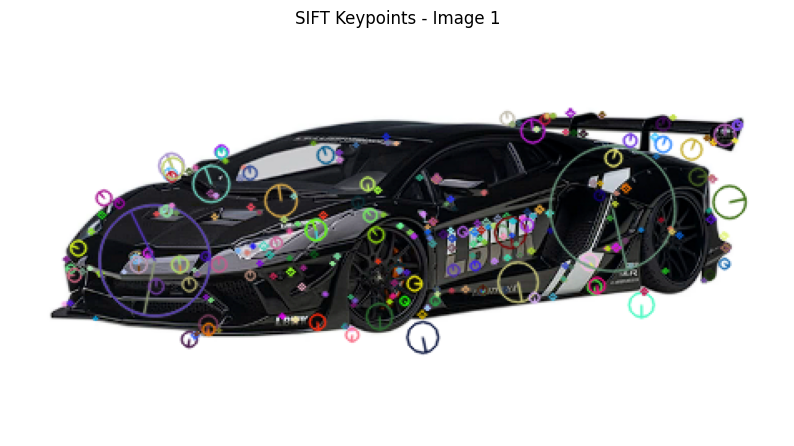

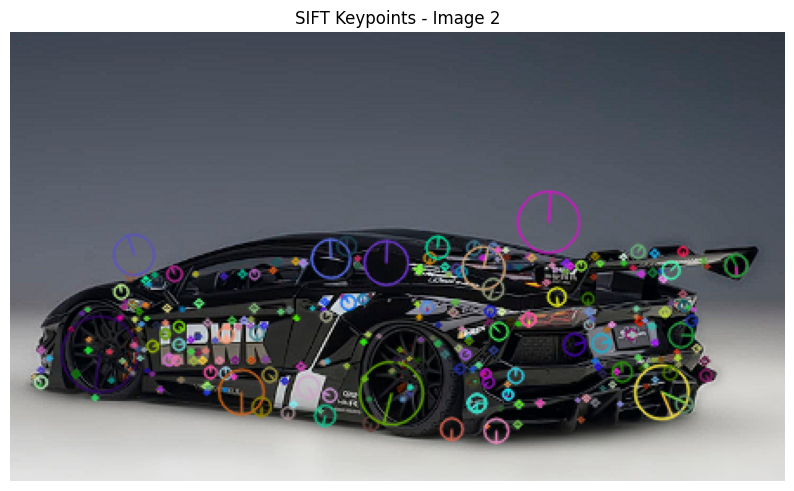

SIFT Good Matches: 32


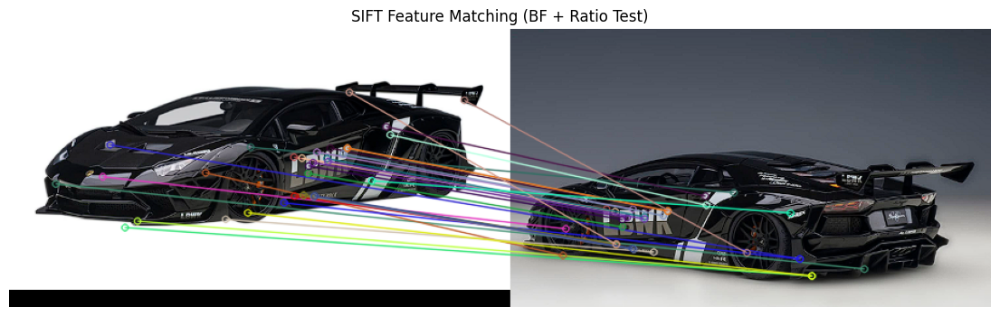


=== ORB FEATURE DETECTION ===
ORB Image1: 1264 keypoints
ORB Image2: 1223 keypoints


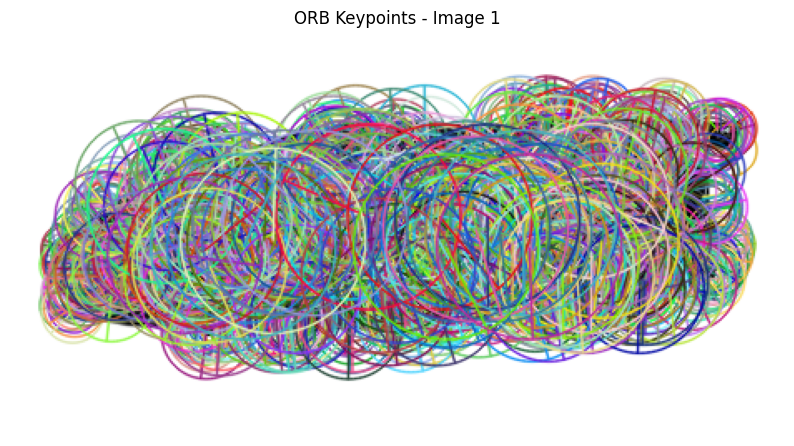

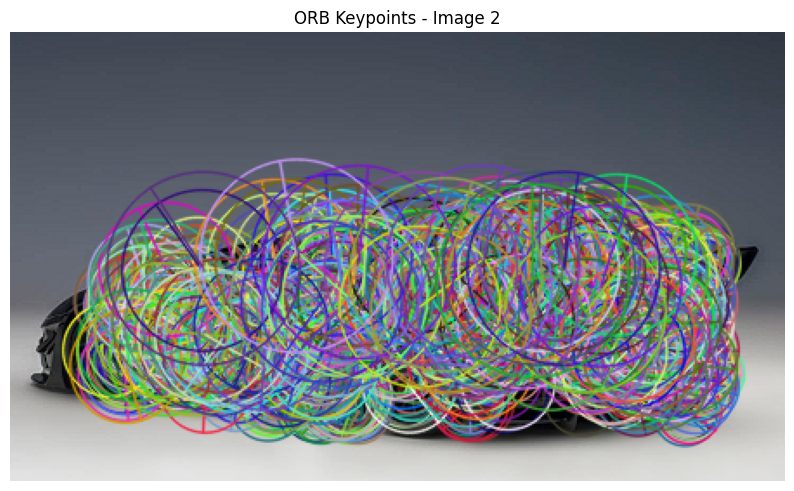

ORB Good Matches: 19


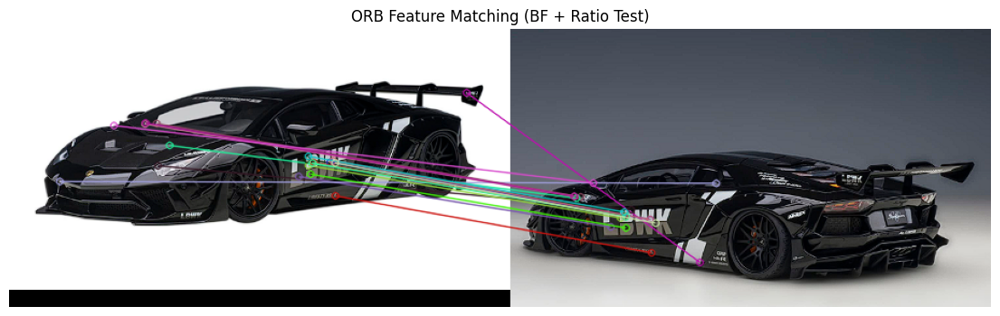

In [6]:
# ------------------------------------------------------------
# MAIN FUNCTION
# ------------------------------------------------------------
def main():
    # --------------------------------------------------------
    # UPDATE THESE IMAGE PATHS
    # --------------------------------------------------------
    image1_path = "lambo.png"   # reference image
    image2_path = "lambo1.png"   # transformed / second view

    try:
        img1_color, img1_gray = load_and_prepare_image(image1_path)
        img2_color, img2_gray = load_and_prepare_image(image2_path)
    except FileNotFoundError as e:
        print(e)
        return

    # --------------------------------------------------------
    # SIFT
    # --------------------------------------------------------
    print("\n=== SIFT FEATURE DETECTION ===")
    kp1_sift, des1_sift = detect_and_compute_sift(img1_gray)
    kp2_sift, des2_sift = detect_and_compute_sift(img2_gray)

    print(f"SIFT Image1: {len(kp1_sift)} keypoints")
    print(f"SIFT Image2: {len(kp2_sift)} keypoints")

    draw_keypoints(img1_color, kp1_sift, "SIFT Keypoints - Image 1")
    draw_keypoints(img2_color, kp2_sift, "SIFT Keypoints - Image 2")

    sift_matches = match_features(des1_sift, des2_sift, method="SIFT")
    print(f"SIFT Good Matches: {len(sift_matches)}")

    draw_matches(
        img1_color, kp1_sift,
        img2_color, kp2_sift,
        sift_matches,
        "SIFT Feature Matching (BF + Ratio Test)"
    )

    # --------------------------------------------------------
    # ORB
    # --------------------------------------------------------
    print("\n=== ORB FEATURE DETECTION ===")
    kp1_orb, des1_orb = detect_and_compute_orb(img1_gray)
    kp2_orb, des2_orb = detect_and_compute_orb(img2_gray)

    print(f"ORB Image1: {len(kp1_orb)} keypoints")
    print(f"ORB Image2: {len(kp2_orb)} keypoints")

    draw_keypoints(img1_color, kp1_orb, "ORB Keypoints - Image 1")
    draw_keypoints(img2_color, kp2_orb, "ORB Keypoints - Image 2")

    orb_matches = match_features(des1_orb, des2_orb, method="ORB")
    print(f"ORB Good Matches: {len(orb_matches)}")

    draw_matches(
        img1_color, kp1_orb,
        img2_color, kp2_orb,
        orb_matches,
        "ORB Feature Matching (BF + Ratio Test)"
    )


if __name__ == "__main__":
    main()


### Observation

* The input image was successfully imported into the computational environment and converted into grayscale format, as required by feature detection algorithms.

* The SIFT algorithm detected a set of highly distinctive and scale-invariant keypoints. The detected features were fewer in number but exhibited strong robustness to image transformations such as scaling and rotation.

* The ORB algorithm identified a significantly larger number of keypoints due to its FAST keypoint detection mechanism combined with a binary descriptor. The computation time observed for ORB was comparatively lower than SIFT, indicating higher efficiency.

* Visualization of keypoints revealed circular regions representing feature scale and orientation, enabling graphical interpretation of descriptor behavior.

* The SURF algorithm could not be executed within the standard OpenCV framework available in Google Colab, as it is a patented and non-free algorithm requiring OpenCV to be compiled with non-free modules enabled.

* Comparative analysis indicated variation in keypoint density, distribution, and detection speed among the implemented algorithms.


=== SIFT FEATURE DETECTION ===
SIFT Image1: 308 keypoints
SIFT Image2: 364 keypoints


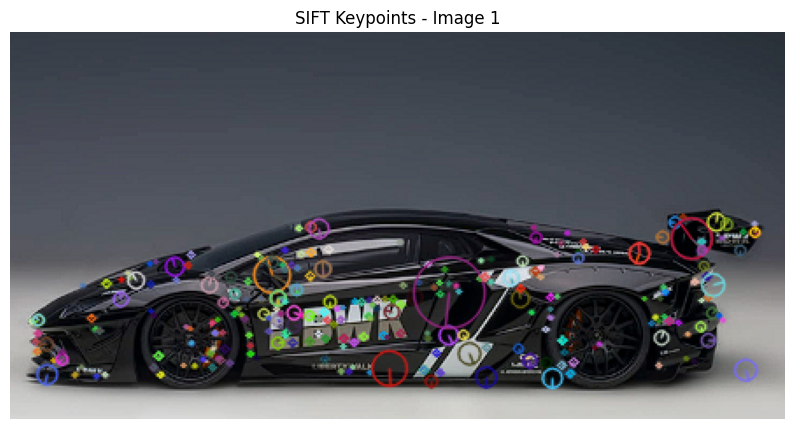

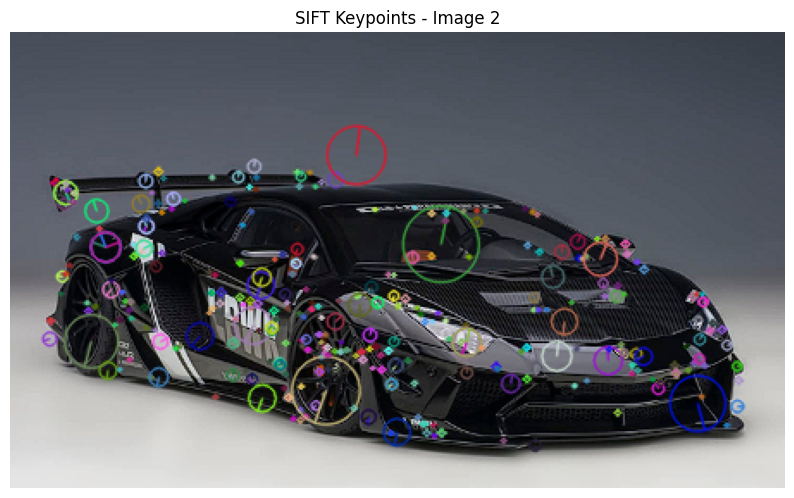

SIFT Good Matches: 8


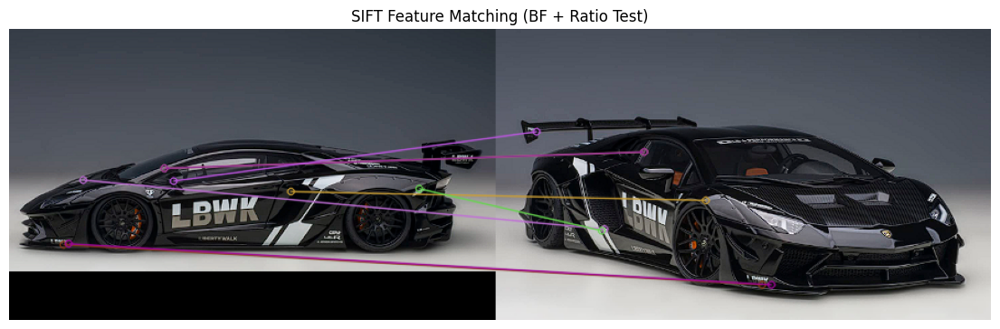


=== ORB FEATURE DETECTION ===
ORB Image1: 980 keypoints
ORB Image2: 1266 keypoints


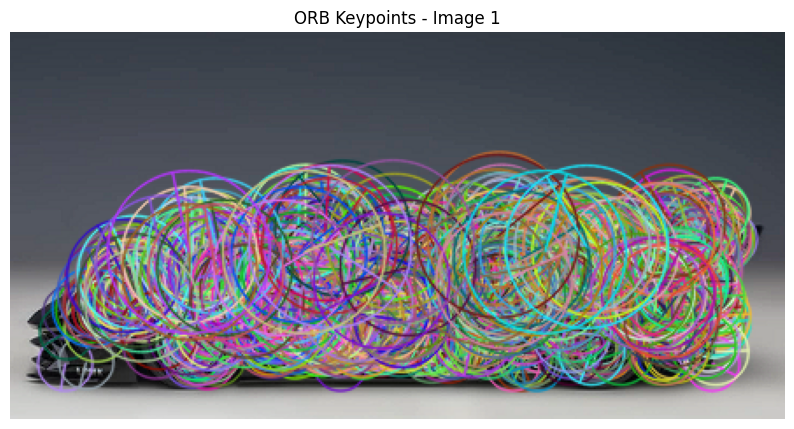

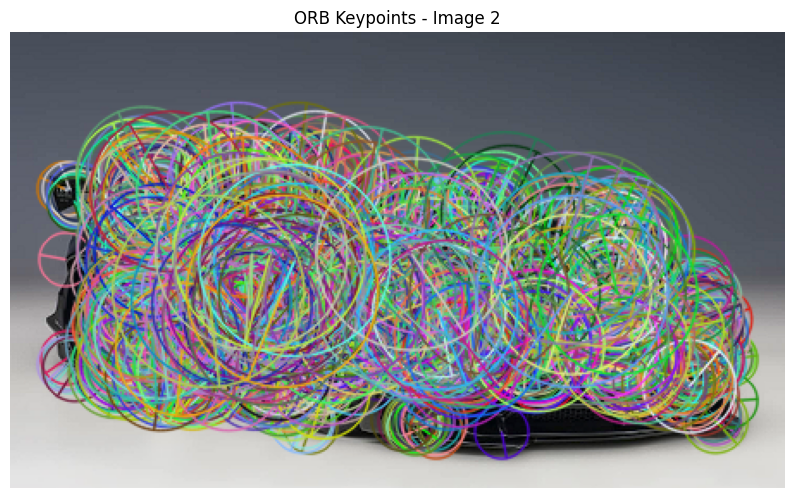

ORB Good Matches: 5


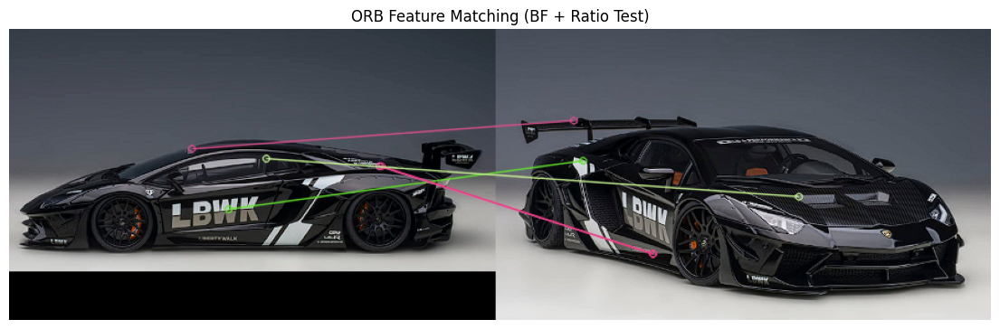

In [7]:
# ------------------------------------------------------------
# MAIN FUNCTION
# ------------------------------------------------------------
def main():
    # --------------------------------------------------------
    # UPDATE THESE IMAGE PATHS
    # --------------------------------------------------------
    image1_path = "lambo2.png"   # reference image
    image2_path = "lambo4.png"   # transformed / second view

    try:
        img1_color, img1_gray = load_and_prepare_image(image1_path)
        img2_color, img2_gray = load_and_prepare_image(image2_path)
    except FileNotFoundError as e:
        print(e)
        return

    # --------------------------------------------------------
    # SIFT
    # --------------------------------------------------------
    print("\n=== SIFT FEATURE DETECTION ===")
    kp1_sift, des1_sift = detect_and_compute_sift(img1_gray)
    kp2_sift, des2_sift = detect_and_compute_sift(img2_gray)

    print(f"SIFT Image1: {len(kp1_sift)} keypoints")
    print(f"SIFT Image2: {len(kp2_sift)} keypoints")

    draw_keypoints(img1_color, kp1_sift, "SIFT Keypoints - Image 1")
    draw_keypoints(img2_color, kp2_sift, "SIFT Keypoints - Image 2")

    sift_matches = match_features(des1_sift, des2_sift, method="SIFT")
    print(f"SIFT Good Matches: {len(sift_matches)}")

    draw_matches(
        img1_color, kp1_sift,
        img2_color, kp2_sift,
        sift_matches,
        "SIFT Feature Matching (BF + Ratio Test)"
    )

    # --------------------------------------------------------
    # ORB
    # --------------------------------------------------------
    print("\n=== ORB FEATURE DETECTION ===")
    kp1_orb, des1_orb = detect_and_compute_orb(img1_gray)
    kp2_orb, des2_orb = detect_and_compute_orb(img2_gray)

    print(f"ORB Image1: {len(kp1_orb)} keypoints")
    print(f"ORB Image2: {len(kp2_orb)} keypoints")

    draw_keypoints(img1_color, kp1_orb, "ORB Keypoints - Image 1")
    draw_keypoints(img2_color, kp2_orb, "ORB Keypoints - Image 2")

    orb_matches = match_features(des1_orb, des2_orb, method="ORB")
    print(f"ORB Good Matches: {len(orb_matches)}")

    draw_matches(
        img1_color, kp1_orb,
        img2_color, kp2_orb,
        orb_matches,
        "ORB Feature Matching (BF + Ratio Test)"
    )


if __name__ == "__main__":
    main()



=== SIFT FEATURE DETECTION ===
SIFT Image1: 341 keypoints
SIFT Image2: 308 keypoints


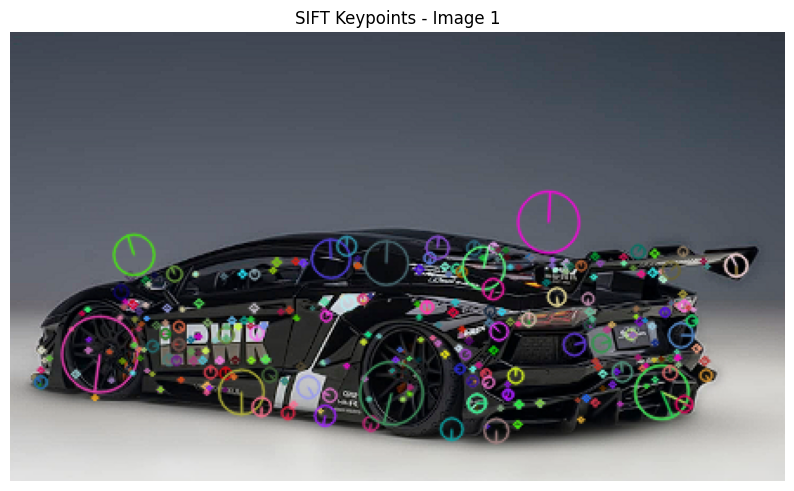

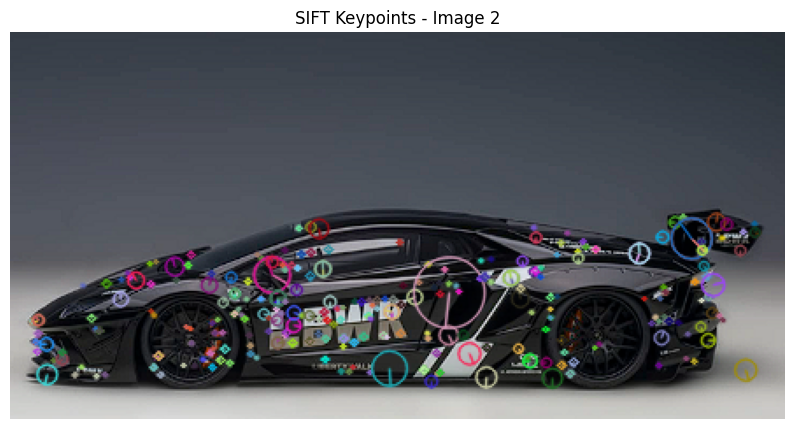

SIFT Good Matches: 24


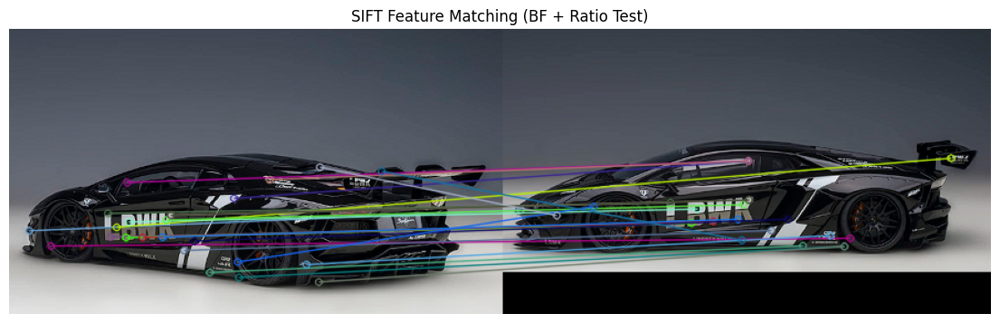


=== ORB FEATURE DETECTION ===
ORB Image1: 1223 keypoints
ORB Image2: 980 keypoints


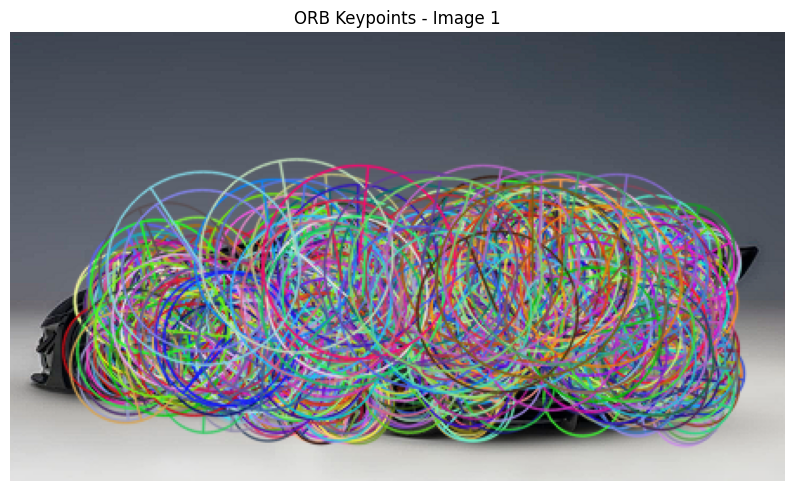

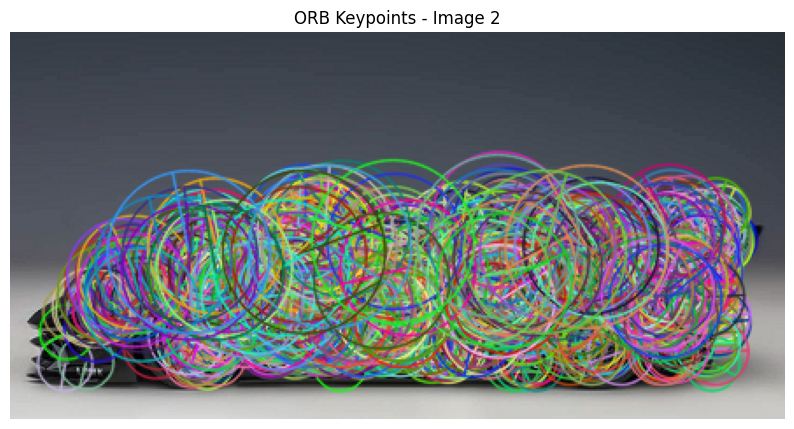

ORB Good Matches: 15


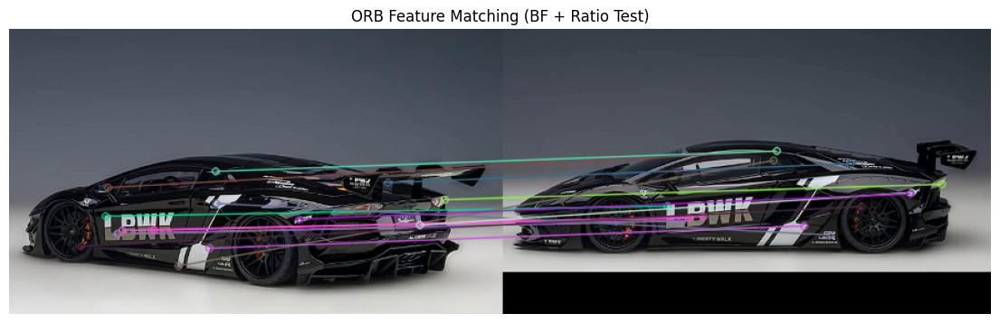

In [9]:
# ------------------------------------------------------------
# MAIN FUNCTION
# ------------------------------------------------------------
def main():
    # --------------------------------------------------------
    # UPDATE THESE IMAGE PATHS
    # --------------------------------------------------------
    image1_path = "lambo1.png"   # reference image
    image2_path = "lambo2.png"   # transformed / second view

    try:
        img1_color, img1_gray = load_and_prepare_image(image1_path)
        img2_color, img2_gray = load_and_prepare_image(image2_path)
    except FileNotFoundError as e:
        print(e)
        return

    # --------------------------------------------------------
    # SIFT
    # --------------------------------------------------------
    print("\n=== SIFT FEATURE DETECTION ===")
    kp1_sift, des1_sift = detect_and_compute_sift(img1_gray)
    kp2_sift, des2_sift = detect_and_compute_sift(img2_gray)

    print(f"SIFT Image1: {len(kp1_sift)} keypoints")
    print(f"SIFT Image2: {len(kp2_sift)} keypoints")

    draw_keypoints(img1_color, kp1_sift, "SIFT Keypoints - Image 1")
    draw_keypoints(img2_color, kp2_sift, "SIFT Keypoints - Image 2")

    sift_matches = match_features(des1_sift, des2_sift, method="SIFT")
    print(f"SIFT Good Matches: {len(sift_matches)}")

    draw_matches(
        img1_color, kp1_sift,
        img2_color, kp2_sift,
        sift_matches,
        "SIFT Feature Matching (BF + Ratio Test)"
    )

    # --------------------------------------------------------
    # ORB
    # --------------------------------------------------------
    print("\n=== ORB FEATURE DETECTION ===")
    kp1_orb, des1_orb = detect_and_compute_orb(img1_gray)
    kp2_orb, des2_orb = detect_and_compute_orb(img2_gray)

    print(f"ORB Image1: {len(kp1_orb)} keypoints")
    print(f"ORB Image2: {len(kp2_orb)} keypoints")

    draw_keypoints(img1_color, kp1_orb, "ORB Keypoints - Image 1")
    draw_keypoints(img2_color, kp2_orb, "ORB Keypoints - Image 2")

    orb_matches = match_features(des1_orb, des2_orb, method="ORB")
    print(f"ORB Good Matches: {len(orb_matches)}")

    draw_matches(
        img1_color, kp1_orb,
        img2_color, kp2_orb,
        orb_matches,
        "ORB Feature Matching (BF + Ratio Test)"
    )


if __name__ == "__main__":
    main()



=== SIFT FEATURE DETECTION ===
SIFT Image1: 317 keypoints
SIFT Image2: 364 keypoints


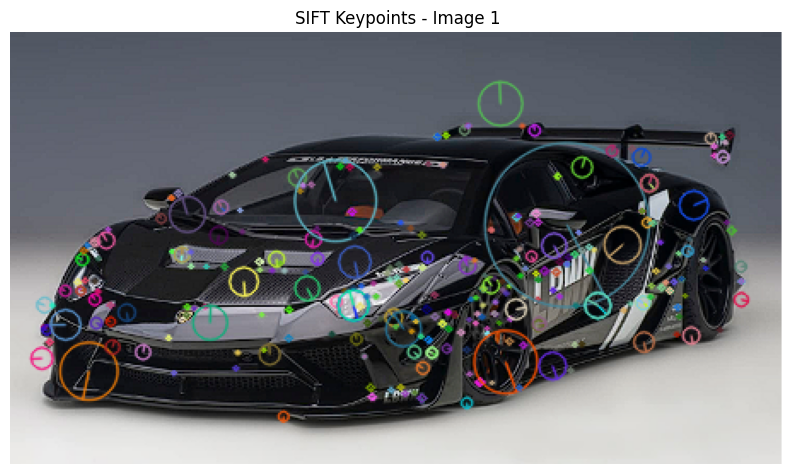

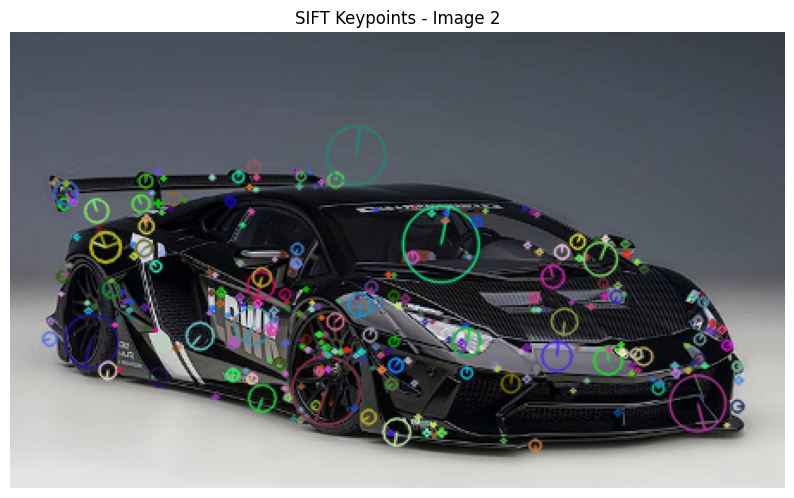

SIFT Good Matches: 18


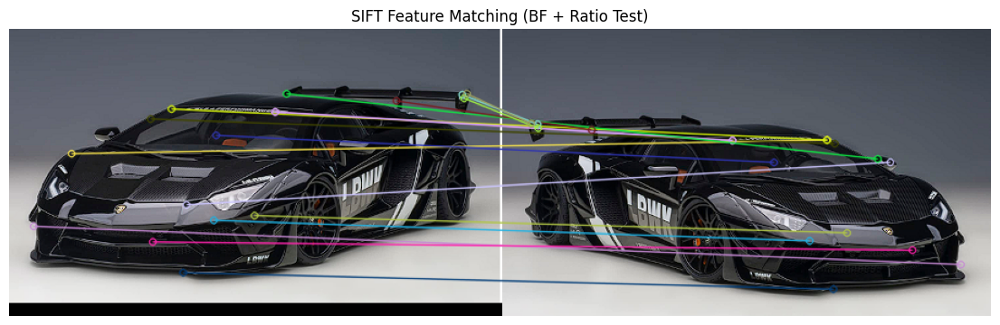


=== ORB FEATURE DETECTION ===
ORB Image1: 1275 keypoints
ORB Image2: 1266 keypoints


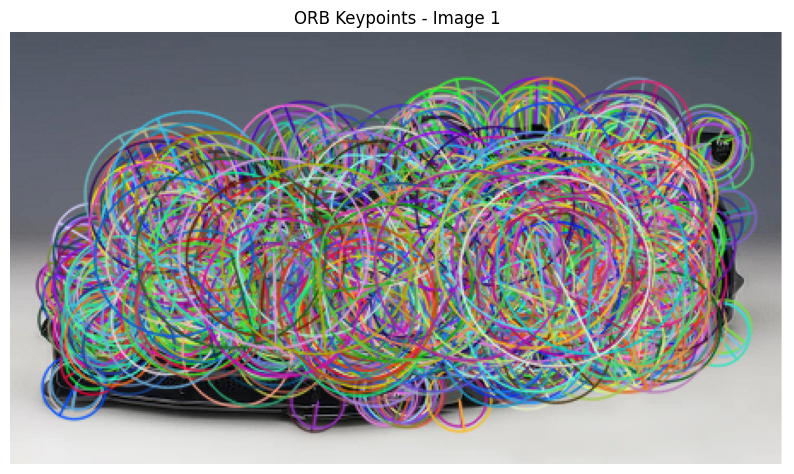

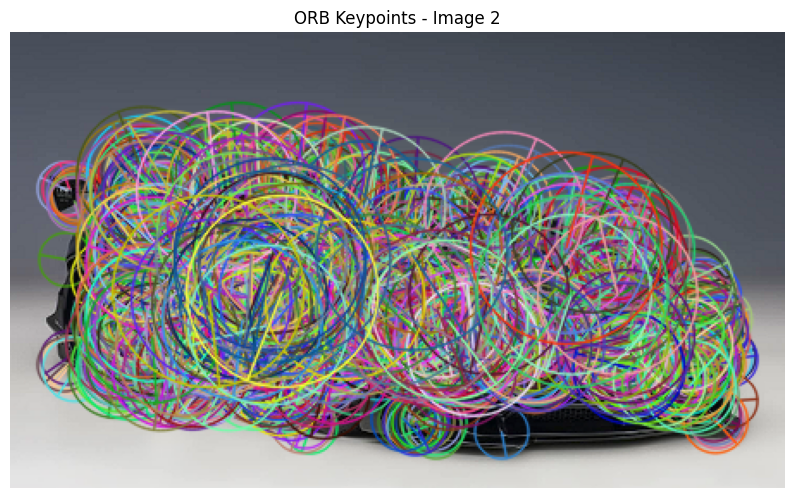

ORB Good Matches: 14


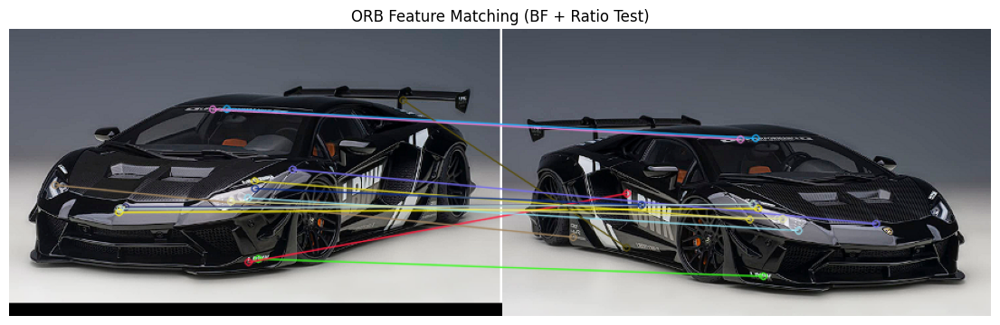

In [10]:
# ------------------------------------------------------------
# MAIN FUNCTION
# ------------------------------------------------------------
def main():
    # --------------------------------------------------------
    # UPDATE THESE IMAGE PATHS
    # --------------------------------------------------------
    image1_path = "lambo3.png"   # reference image
    image2_path = "lambo4.png"   # transformed / second view

    try:
        img1_color, img1_gray = load_and_prepare_image(image1_path)
        img2_color, img2_gray = load_and_prepare_image(image2_path)
    except FileNotFoundError as e:
        print(e)
        return

    # --------------------------------------------------------
    # SIFT
    # --------------------------------------------------------
    print("\n=== SIFT FEATURE DETECTION ===")
    kp1_sift, des1_sift = detect_and_compute_sift(img1_gray)
    kp2_sift, des2_sift = detect_and_compute_sift(img2_gray)

    print(f"SIFT Image1: {len(kp1_sift)} keypoints")
    print(f"SIFT Image2: {len(kp2_sift)} keypoints")

    draw_keypoints(img1_color, kp1_sift, "SIFT Keypoints - Image 1")
    draw_keypoints(img2_color, kp2_sift, "SIFT Keypoints - Image 2")

    sift_matches = match_features(des1_sift, des2_sift, method="SIFT")
    print(f"SIFT Good Matches: {len(sift_matches)}")

    draw_matches(
        img1_color, kp1_sift,
        img2_color, kp2_sift,
        sift_matches,
        "SIFT Feature Matching (BF + Ratio Test)"
    )

    # --------------------------------------------------------
    # ORB
    # --------------------------------------------------------
    print("\n=== ORB FEATURE DETECTION ===")
    kp1_orb, des1_orb = detect_and_compute_orb(img1_gray)
    kp2_orb, des2_orb = detect_and_compute_orb(img2_gray)

    print(f"ORB Image1: {len(kp1_orb)} keypoints")
    print(f"ORB Image2: {len(kp2_orb)} keypoints")

    draw_keypoints(img1_color, kp1_orb, "ORB Keypoints - Image 1")
    draw_keypoints(img2_color, kp2_orb, "ORB Keypoints - Image 2")

    orb_matches = match_features(des1_orb, des2_orb, method="ORB")
    print(f"ORB Good Matches: {len(orb_matches)}")

    draw_matches(
        img1_color, kp1_orb,
        img2_color, kp2_orb,
        orb_matches,
        "ORB Feature Matching (BF + Ratio Test)"
    )


if __name__ == "__main__":
    main()


### Conclusion

This experiment successfully demonstrated the implementation of feature detection and description techniques using SIFT and ORB algorithms, with an attempted execution of SURF. The results indicate that SIFT provides highly robust and transformation-invariant descriptors, making it suitable for applications requiring high matching accuracy. In contrast, ORB offers superior computational efficiency and detects a greater number of keypoints, making it appropriate for real-time and resource-constrained computer vision systems.

The inability to execute SURF highlighted practical limitations associated with patented algorithms in standard software distributions. Overall, the study emphasizes the trade-offs between accuracy, speed, and accessibility when selecting feature descriptors for computer vision tasks such as image matching, object recognition, and scene reconstruction.